# Imports

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.exposure import equalize_adapthist
from skimage.morphology import square, disk, remove_small_objects, erosion, dilation, closing, opening
from skimage.morphology import area_opening, binary_closing, binary_opening, binary_dilation, binary_erosion

from src.models import InputImage
from src.well import find_well_props

# Functions

In [ ]:
def plot_images(images, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary',
                title=None, hist=False, nums=False):
    if count is not None:
        images = images[0:count]

    l = len(images)

    if cols is None:
        cols = 4

    rows = int(l / cols)
    if l < cols: cols = l
    if l % cols != 0 or rows == 0:
        rows += 1

    fig, ax = plt.subplots(rows, cols, figsize=fig)
    ax = ax.ravel()
    for i, img in enumerate(images):
        if i >= l: return

        if nums: ax[i].set_title(f'#{i}')

        if not hist:
            ax[i].imshow(img, cmap)
            if not ticks:  # turn off ticks
                ax[i].get_xaxis().set_visible(False)
                ax[i].get_yaxis().set_visible(False)
        else:
            ax[i].hist(img.ravel(), bins=256)
    fig.suptitle(title, fontsize=56)
    plt.tight_layout()

In [ ]:
def plot_fishes(fishes, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary'):
    images = list(map(lambda x: x.processed, fishes))  # Change this!
    plot_images(images, cols, count, fig, ticks, cmap)

## Functions

In [ ]:
def adaptiveTh(img: np.ndarray, block_size=7, c=1) -> np.ndarray:
    return cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, block_size, c)

In [ ]:
def rangefilter(img: np.ndarray):
    d = dilation(img, square(3))  # max of 3x3 nbh
    e = erosion(img, square(3))  # min of 3x3 nbh
    return d - e

In [ ]:
def edge_finding(img: np.ndarray, mask=None) -> np.ndarray:  # Function replacing edge filter
    edges = rangefilter(img)  # rangefilter
    return equalize_adapthist(edges)  # strech contrast

## GetPlateWidthAndRemoveSides

In [ ]:
from remove_container import get_perimeter
def get_menisc(binary_img: np.ndarray, mask: np.ndarray, corrected=False) -> np.ndarray:
    remaining_binary_img = binary_img.copy()

    if not corrected:
        structuring_element = disk(21)
        eroded_well = erosion(mask, structuring_element)
        remaining_binary_img[np.where(eroded_well > 0)] = 0
        remaining_binary_img = area_opening(remaining_binary_img, 100).astype(bool)

    mh, mw = binary_img.shape[0], binary_img.shape[1]
    ch, cw = int(mh / 2), int(mw / 2)

    lt = remaining_binary_img[0:ch, 0:cw]
    lb = remaining_binary_img[ch:mh, 0:cw]
    rt = remaining_binary_img[0:ch, cw:mw]
    rb = remaining_binary_img[ch:mh, cw:mw]

    plot_images([lt, rt, lb, rb], 2, fig=(10, 5))

    cont = get_perimeter(mask)

    # lt_thresh = mean_4_col_sum(lt, "lt", cont)
    # lb_thresh = mean_4_col_sum(lb, "lb", cont)
    # rt_thresh = mean_4_col_sum(rt, "rt", cont)
    # rb_thresh = mean_4_col_sum(rb, "rb", cont)
    lt_thresh = rc(lt, cont[0:ch, 0:cw], 3)
    lb_thresh = rc(lb, cont[ch:mh, 0:cw], 3)
    rt_thresh = rc(rt, cont[0:ch, cw:mw], 3)
    rb_thresh = rc(rb, cont[ch:mh, cw:mw], 3)

    plot_images([lt_thresh, lb_thresh, rt_thresh, rb_thresh], 2)

    left_side = np.concatenate((lt_thresh, lb_thresh), axis=0)
    right_side = np.concatenate((rt_thresh, rb_thresh), axis=0)
    full = np.concatenate((left_side, right_side), axis=1)

    return full

In [ ]:
def rc(data: np.ndarray, cont: np.ndarray, se: int) -> np.ndarray:
    cont = binary_dilation(cont, square(se))
    dilated_cont_masked = data * cont

    plot_images([data, cont])

    perim_nonzero = len(cont.nonzero()[0])
    masked_nonzero = len(dilated_cont_masked.nonzero()[0])

    filled = masked_nonzero / perim_nonzero
    if filled < 0.5:
        rc(data, cont, se + 2)
    return dilated_cont_masked

# RUN!!!

# Fishes in extracted wells

In [ ]:
fishes = [InputImage("zf1.JPG"), InputImage("zf2.JPG"), InputImage("zf3.JPG"), InputImage("zf4.JPG"),
          InputImage("zf5.JPG"), InputImage("zf6.JPG"), InputImage("zf7.JPG"), InputImage("zf8.JPG")]

for fish in fishes:
    fish = find_well_props(fish)

# Hough-transformation finished
_____________________________________________________________
# Creating circle mask for well
_____________________________________________________________
# Circle mask for well created
_____________________________________________________________
# Creating remaining masks:
_____________________________________________________________
# Creating cropped mask
_____________________________________________________________
# Creating masked image (original)
_____________________________________________________________
# Creating masked image (cropped)
_____________________________________________________________
# Created remaining masks
_____________________________________________________________
# Searching for well properties
_____________________________________________________________
# Hough-transformation for the well
_____________________________________________________________
# Hough-transformation finished
______________________________________

In [ ]:
masks = []
maskeds = []
for fish in fishes:
    masks.append(fish.well_props.mask.cropped)
    maskeds.append(fish.well_props.mask.cropped_masked)

# Rangefilter*
With all available

In [ ]:
edge = []

for fish in fishes:
    rngfilter = rangefilter(fish.processed)
    n = cv2.normalize(rngfilter, None, 0, 255, cv2.NORM_MINMAX)
    edge.append(equalize_adapthist(n))

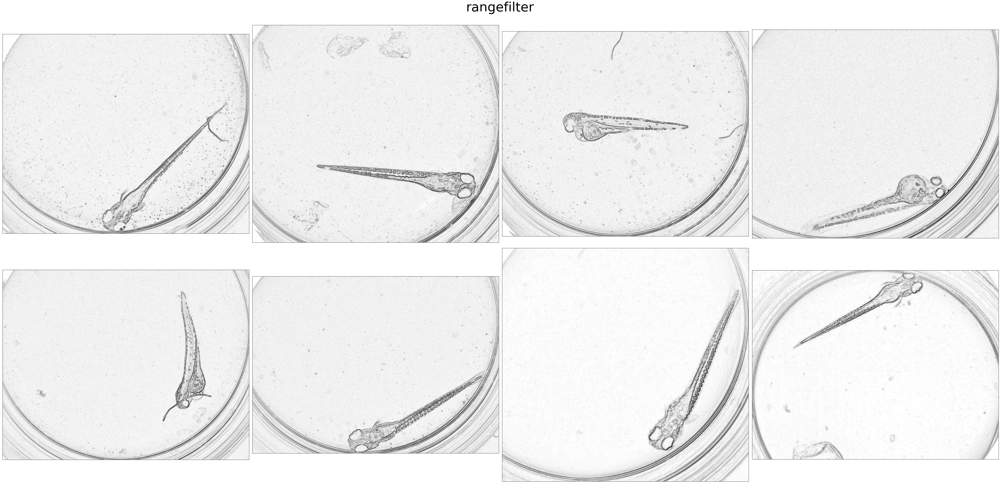

In [ ]:
# plot_fishes(fishes, fig=(20, 10))
hist = False
plot_images(edge, fig=(60, 30), cmap='binary', title='rangefilter', hist=hist)

# Wiener filter*

In [ ]:
from scipy.signal import wiener
from skimage.exposure import equalize_hist

denoised = []
# for fish in fishes:
#    fish.processed = denoising(fish.processed) # wiener filter
for i, fish in enumerate(edge):
    denoised.append(wiener(fish, 30) * masks[i])

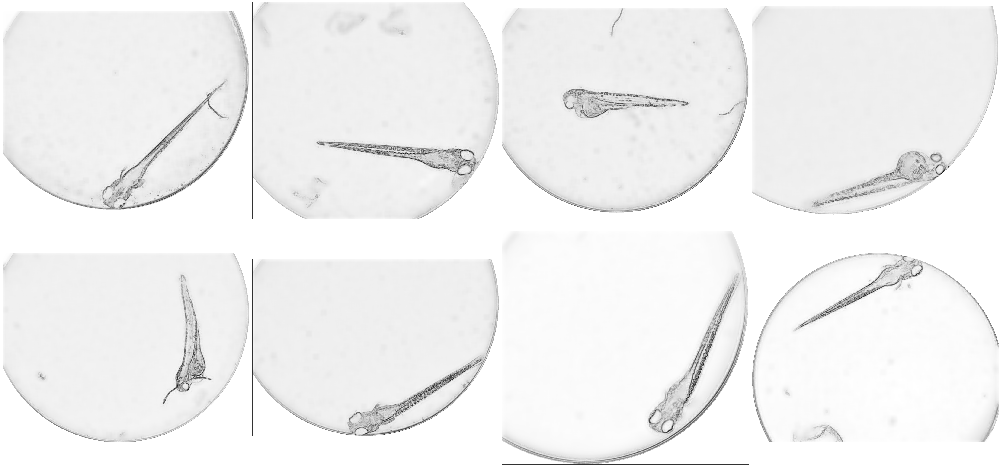

In [ ]:
# plot_fishes(fishes, fig=(60, 30))
plot_images(denoised, fig=(60, 30))

# Adaptive threshold

In [ ]:
ath = []
# for fish in fishes:
# fish.processed = adaptiveTh(fish.processed)
for i, fish in enumerate(denoised):
    # block = int(2 * np.floor(np.mean(np.asarray(fish.shape)) / 14) + 1) # Megpróbáltam a MATLABOSAT
    a = np.round(cv2.normalize(fish, None, 0, 255, cv2.NORM_MINMAX)).astype(np.uint8)
    ath.append(adaptiveTh(a, block_size=3).astype(bool) * masks[i])

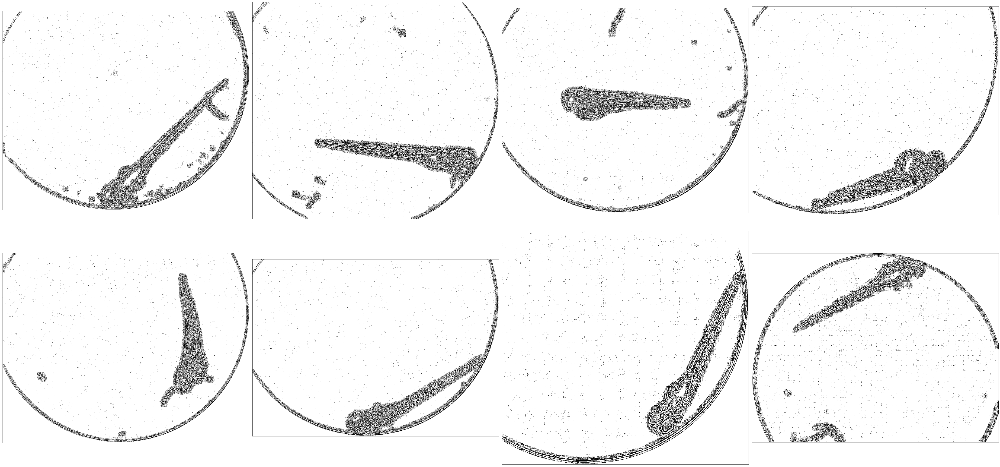

In [ ]:
from skimage.filters.thresholding import try_all_threshold

# plot_fishes(fishes, fig=(20, 10))
plot_images(ath, fig=(60, 30), cmap='binary')

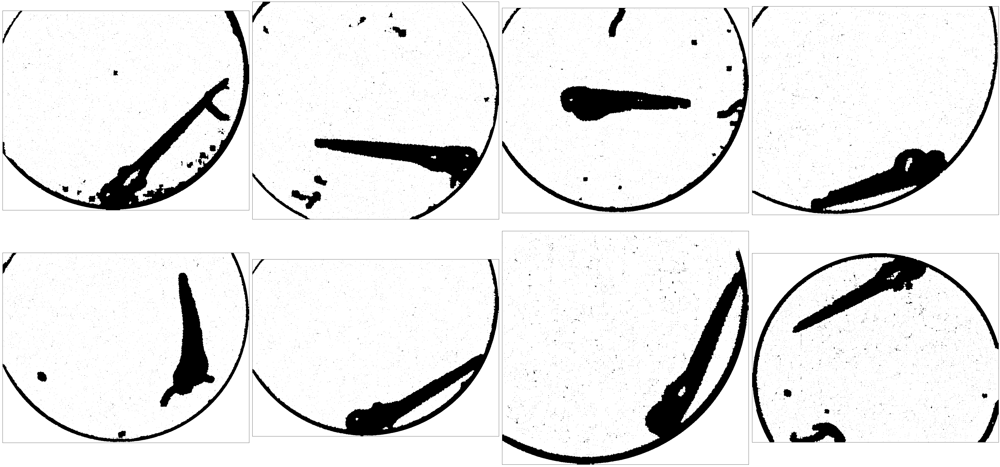

In [ ]:
close = []
for i, fish in enumerate(ath):
    close.append(binary_closing(fish, disk(3)))

plot_images(close, fig=(60, 30))

# bwareaopen

In [19]:
bwao = []
for i, fish in enumerate(close):
    bwao.append(area_opening(fish, 100).astype(bool) * masks[i])

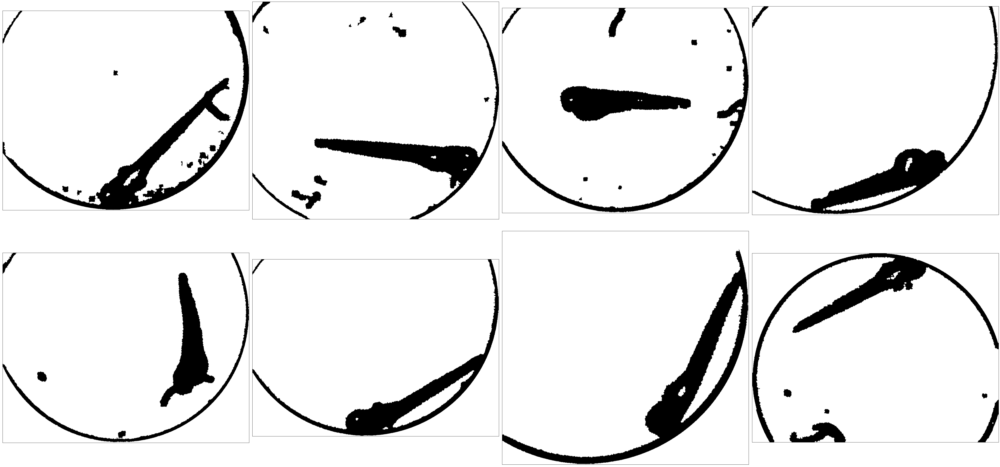

In [20]:
plot_images(bwao, fig=(60, 30), cmap='binary')

# Removing meniscus

In [ ]:
"""def get_menisc(binary_img: np.ndarray, mask: np.ndarray) -> np.ndarray:
    remaining_binary_img = binary_img.copy()

    mh, mw = binary_img.shape[0], binary_img.shape[1]
    ch, cw = int(mh / 2), int(mw / 2)

    lt = remaining_binary_img[0:ch, 0:cw]
    lb = remaining_binary_img[ch:mh, 0:cw]
    rt = remaining_binary_img[0:ch, cw:mw]
    rb = remaining_binary_img[ch:mh, cw:mw]

    cont = get_perimeter(mask).astype(bool)
    lt_c = cont[0:ch, 0:cw]
    lb_c = cont[ch:mh, 0:cw]
    rt_c = cont[0:ch, cw:mw]
    rb_c = cont[ch:mh, cw:mw]

    #print('lt')
    lt_thresh = rc(lt, lt_c, 3)
    #print('lb')
    lb_thresh = rc(lb, lb_c, 3)
    #print('rt')
    rt_thresh = rc(rt, rt_c, 3)
    #print('rb')
    rb_thresh = rc(rb, rb_c, 3)

    # plot_images([lt_thresh, rt_thresh, lb_thresh, rb_thresh], 2)

    left_side = np.concatenate((lt_thresh, lb_thresh), axis=0)
    right_side = np.concatenate((rt_thresh, rb_thresh), axis=0)
    full = np.concatenate((left_side, right_side), axis=1)

    return full


def rc(data: np.ndarray, cont: np.ndarray, se: int) -> np.ndarray:
    cont = binary_dilation(cont, square(se))
    dilated_cont_masked = data * cont

    perim_nonzero = len(cont.nonzero()[0])
    masked_nonzero = len(dilated_cont_masked.nonzero()[0])
    if perim_nonzero == 0:
        return data

    filled = masked_nonzero / perim_nonzero
    if filled > 0.45:
        return rc(data, cont, se + 1)
    return dilated_cont_masked"""

In [21]:
from src.fish.remove_container import get_meniscus_effect

menisci = []
for i, fish in enumerate(bwao):
    menisci.append(get_meniscus_effect(bwao[i], masks[i]))

In [22]:
no_menisci_ = []
no_menisci = []
for i, meniscus in enumerate(menisci):
    no_menisci_.append(bwao[i] - meniscus)
    no_menisci.append(bwao[i] * meniscus)

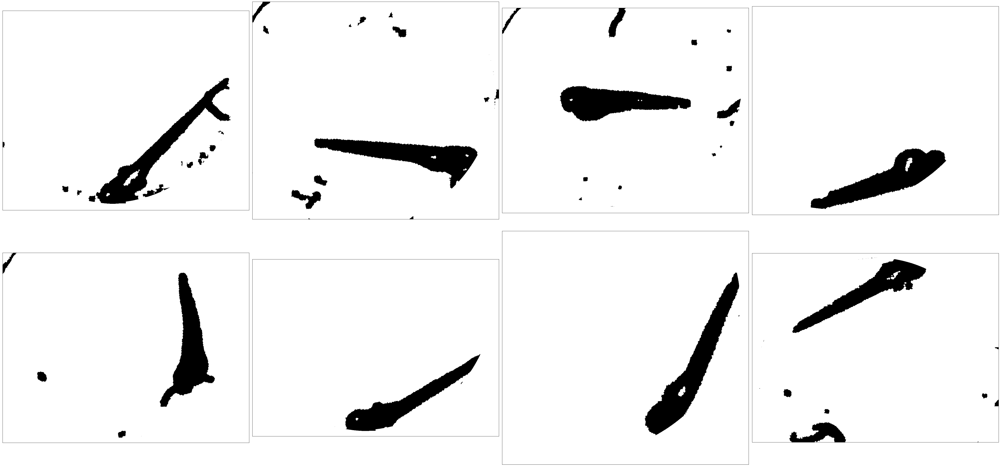

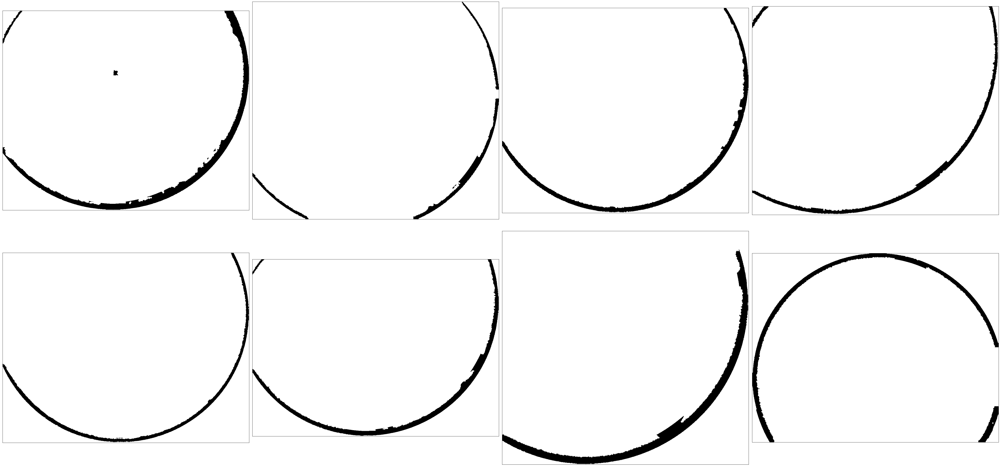

In [23]:
plot_images(no_menisci_, fig=(60, 30), cmap='binary')
plot_images(no_menisci, fig=(60, 30), cmap='binary')

In [28]:
from src.utils import keep_2_largest_object, keep_largest_object
from skimage.morphology import remove_small_holes

klo = []

for i, fish in enumerate(no_menisci_):
    klo.append(keep_largest_object(fish, filled=True) * maskeds[i])

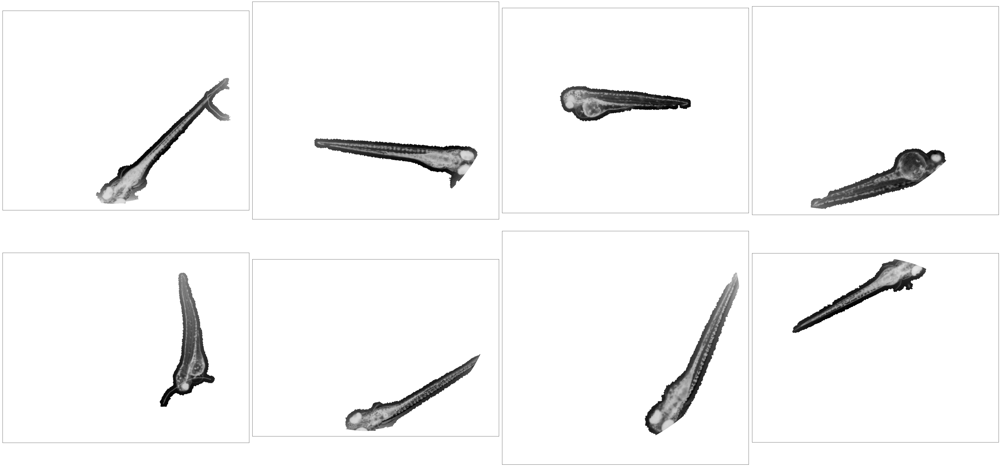

In [29]:
plot_images(klo, fig=(60, 30))

In [26]:
#plot_images(cl, fig=(60, 30), title='Closed')
#plot_images(klo, fig=(60, 30), title='KLO')
#plot_images(msk, fig=(60, 30), title='Maskeds')
#plot_images(op, fig=(60, 30), title='Ope')
#plot_images(cl, fig=(60, 30), title='Clos')

_________________________________

# HOMOMORPHIC - fail

# Testies